In [ ]:
!pip uninstall opencv-python -y
# downgrade OpenCV a bit since some none-free features are not avilable
!pip install opencv-contrib-python --force-reinstall

Found existing installation: opencv-python 4.8.0.76
Uninstalling opencv-python-4.8.0.76:
  Successfully uninstalled opencv-python-4.8.0.76
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 MB 12.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 54.9 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.23.5
    Uninstalling numpy-1.23.5:
      Successfully uninstalled numpy-1.23.5
  Attempting uninstall: opencv-contrib-python
    Found existing installation: opencv-contrib-python 4.8.0.76
    Uninstalling opencv-contrib-python-4.8.0.76:
      Successfully uninstalled opencv-contrib-python-4.8.0.76
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dopamine-rl 4.0.6 requires opencv-python>=3.4.8.29, which is not installed.
imgaug 0.4.0 requires opencv-python, which is not installed.
cupy-cuda11x 11

In [ ]:
# Download data : two images of a scene taken from different points of view
!wget https://raw.githubusercontent.com/YoniChechik/AI_is_Math/master/c_08_features/left.jpg
!wget https://raw.githubusercontent.com/YoniChechik/AI_is_Math/master/c_08_features/right.jpg

--2023-10-17 12:57:11--  https://raw.githubusercontent.com/YoniChechik/AI_is_Math/master/c_08_features/left.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 166595 (163K) [image/jpeg]
Saving to: ‘left.jpg.1’

left.jpg.1          100%[===================>] 162.69K  --.-KB/s    in 0.04s   

2023-10-17 12:57:11 (3.85 MB/s) - ‘left.jpg.1’ saved [166595/166595]

--2023-10-17 12:57:11--  https://raw.githubusercontent.com/YoniChechik/AI_is_Math/master/c_08_features/right.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.110.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 165300 (161K

In [ ]:
from random import randrange
import matplotlib.pyplot as plt
import numpy as np
import cv2

In [ ]:
rgb_l = cv2.cvtColor(cv2.imread("left.jpg"), cv2.COLOR_BGR2RGB)
gray_l = cv2.cvtColor(rgb_l, cv2.COLOR_RGB2GRAY)
rgb_r = cv2.cvtColor(cv2.imread("right.jpg"), cv2.COLOR_BGR2RGB)
gray_r = cv2.cvtColor(rgb_r, cv2.COLOR_RGB2GRAY)

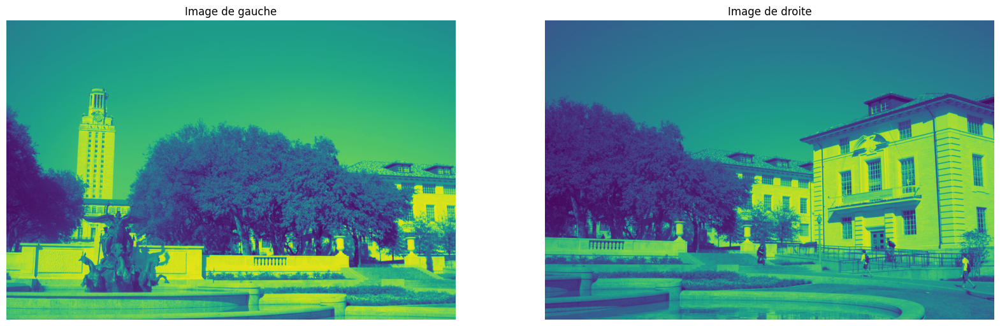

In [ ]:
# Créer une figure avec deux sous-graphiques côte à côte
fig, axes = plt.subplots(1, 2, figsize=(20, 20))

# Afficher l'image de gauche dans le deuxième sous-graphique
axes[0].imshow(gray_l)
axes[0].set_title('Image de gauche')

# Afficher l'image de droite dans le premier sous-graphique
axes[1].imshow(gray_r)
axes[1].set_title('Image de droite')

for ax in axes:
    ax.axis('off')
plt.show()

**SIFT feature detection and description :**

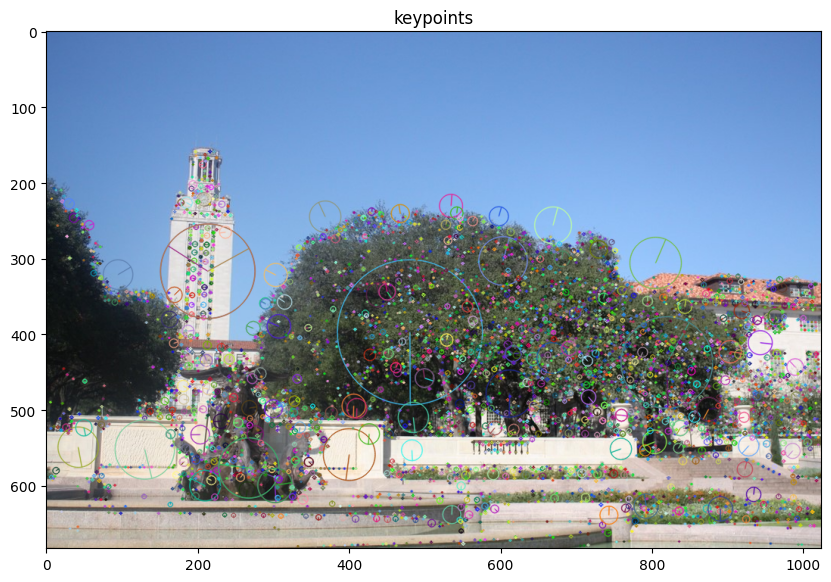

In [ ]:
# use orb if sift is not installed
feature_extractor = cv2.xfeatures2d.SIFT_create()

# find the keypoints and descriptors with chosen feature_extractor
kp_l, desc_l = feature_extractor.detectAndCompute(gray_l, None)
kp_r, desc_r = feature_extractor.detectAndCompute(gray_r, None)

test = cv2.drawKeypoints(rgb_l, kp_l, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(10, 10))
plt.imshow(test)
plt.title("keypoints")
plt.show()

After we get keypoints we need to find similar on both images. For this task we will use KNN matcher from OpenCV

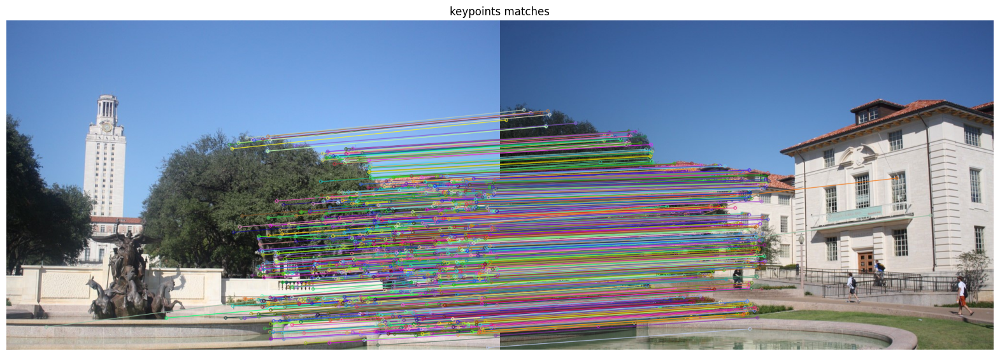

In [ ]:
bf = cv2.BFMatcher()
matches = bf.knnMatch(desc_l, desc_r, k=2)

# store all the good matches as per Lowe's ratio test.
good_match = []
for m, n in matches:
    if m.distance < 0.7 * n.distance:
        good_match.append(m)

# if less then 10 points matched -> not the same images or higly distorted
MIN_MATCH_COUNT = 10
if len(good_match) > MIN_MATCH_COUNT:
    src_pts = np.float32([kp_l[m.queryIdx].pt for m in good_match
                          ]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp_r[m.trainIdx].pt for m in good_match
                          ]).reshape(-1, 1, 2)

    kp_l_matched=([ kp_l[m.queryIdx] for m in good_match ])
    kp_r_matched=([ kp_r[m.trainIdx] for m in good_match ])

    matches = cv2.drawMatches(rgb_l,kp_l,rgb_r,kp_r, good_match,None, flags=2)
    plt.figure(figsize=(20,10))
    plt.axis('off')
    plt.title("keypoints matches")
    plt.imshow(matches),plt.show()


else:
    print("Not  enough  matches are found   -   %d/%d" % (len(good_match), MIN_MATCH_COUNT))
    matchesMask = None

Trouver l'homographie entre les images (une transformation de perspective entre deux plans).

In [ ]:
H, mask = cv2.findHomography(dst_pts, src_pts, cv2.RANSAC, 5.0)
print(H)

[[ 7.68816051e-01  3.28824267e-02  4.47010883e+02]
 [-1.33599139e-01  9.09252328e-01  7.63224958e+01]
 [-2.06738311e-04 -3.70831725e-05  1.00000000e+00]]


**Image Warping Test**

Le code ci-dessous déforme une image à l'aide d'une matrice de transformation 3x3. Expérimentez avec la matrice H pour tester certaines des différentes transformations 2D décrites en classe, par exemple les transformations de similarité, affines et projectives.

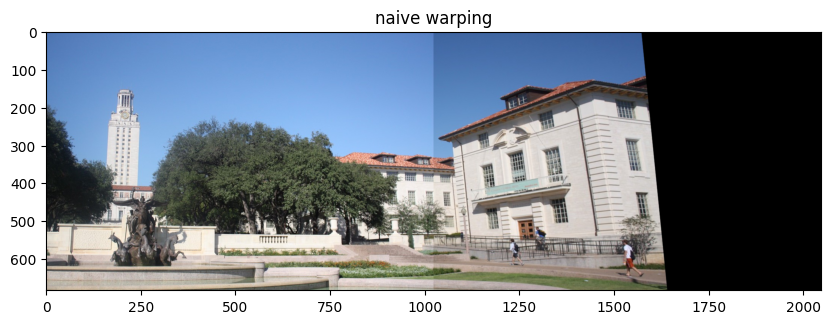

In [ ]:
rgb_r_warped = cv2.warpPerspective(rgb_r, H, (rgb_l.shape[1] + rgb_r.shape[1], rgb_l.shape[0]))
rgb_r_warped[0:rgb_l.shape[0], 0:rgb_l.shape[1]] = rgb_l

plt.figure(figsize=(10, 10))
plt.imshow(rgb_r_warped)
plt.title("naive warping")
plt.show()

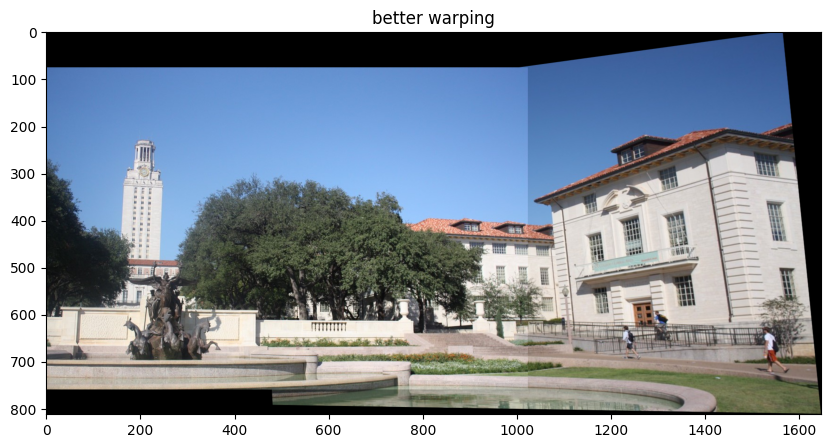

In [ ]:


def warpTwoImages(img1, img2, H):
    '''warp img2 to img1 with homograph H
    from: https://stackoverflow.com/questions/13063201/how-to-show-the-whole-image-when-using-opencv-warpperspective
    '''
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]
    pts1 = np.float32([[0, 0], [0, h1], [w1, h1], [w1, 0]]).reshape(-1, 1, 2)
    pts2 = np.float32([[0, 0], [0, h2], [w2, h2], [w2, 0]]).reshape(-1, 1, 2)
    pts2_ = cv2.perspectiveTransform(pts2, H)
    pts = np.concatenate((pts1, pts2_), axis=0)
    [xmin, ymin] = np.int32(pts.min(axis=0).ravel() - 0.5)
    [xmax, ymax] = np.int32(pts.max(axis=0).ravel() + 0.5)
    t = [-xmin, -ymin]
    Ht = np.array([[1, 0, t[0]], [0, 1, t[1]], [0, 0, 1]])  # translate

    result = cv2.warpPerspective(img2, Ht@H, (xmax-xmin, ymax-ymin))
    result[t[1]:h1+t[1], t[0]:w1+t[0]] = img1
    return result


result = warpTwoImages(rgb_l, rgb_r, H)

plt.figure(figsize=(10, 10))
plt.imshow(result)
plt.title("better warping")
plt.show()


# **Exercice 1 :** Repeat the warping fonction to obtaine the following effect

In [ ]:
!wget -q -O test_1.jpg https://github.com/learnml-today/object-detection-with-pytorch/blob/master/imgs/test_1.jpg?raw=true
!wget -q -O test_1_edit.jpg https://github.com/learnml-today/object-detection-with-pytorch/blob/master/imgs/test_1_edit.jpg?raw=true

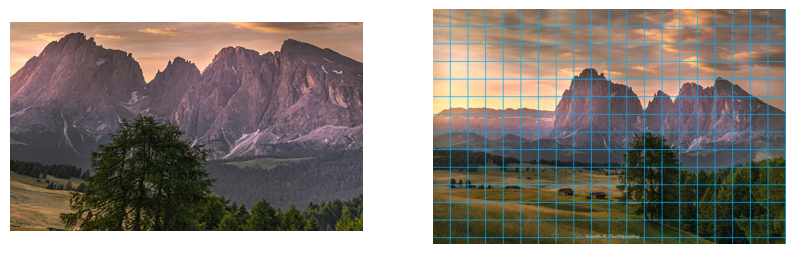

In [ ]:
rgb_test_1 = cv2.cvtColor(cv2.imread("test_1.jpg"), cv2.COLOR_BGR2RGB)
rgb_test_1_edit = cv2.cvtColor(cv2.imread("test_1_edit.jpg"), cv2.COLOR_BGR2RGB)

gray_test_1 = cv2.cvtColor(rgb_test_1, cv2.COLOR_RGB2GRAY)
gray_test_1_edit = cv2.cvtColor(rgb_test_1_edit, cv2.COLOR_RGB2GRAY)

# Créer une figure avec deux sous-graphiques côte à côte
fig, axes = plt.subplots(1, 2, figsize=(10, 10))

axes[0].imshow(rgb_test_1_edit)
axes[1].imshow(rgb_test_1)

for ax in axes:
    ax.axis('off')
plt.show()

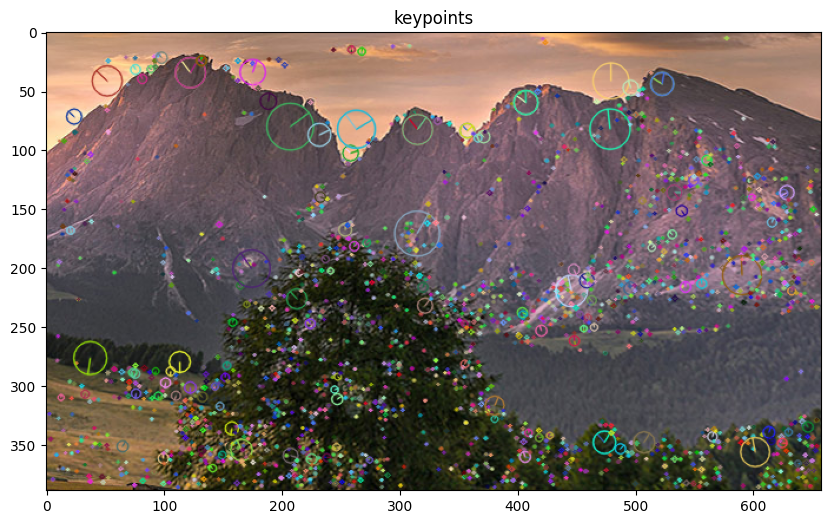

In [ ]:
# use orb if sift is not installed
feature_extractor = cv2.xfeatures2d.SIFT_create()

# find the keypoints and descriptors with chosen feature_extractor
kp_test_1_edit, desc_test_1_edit = feature_extractor.detectAndCompute(gray_test_1_edit, None)
kp_test_1, desc_test_1 = feature_extractor.detectAndCompute(gray_test_1, None)

test = cv2.drawKeypoints(rgb_test_1_edit, kp_test_1_edit, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(10, 10))
plt.imshow(test)
plt.title("keypoints")
plt.show()

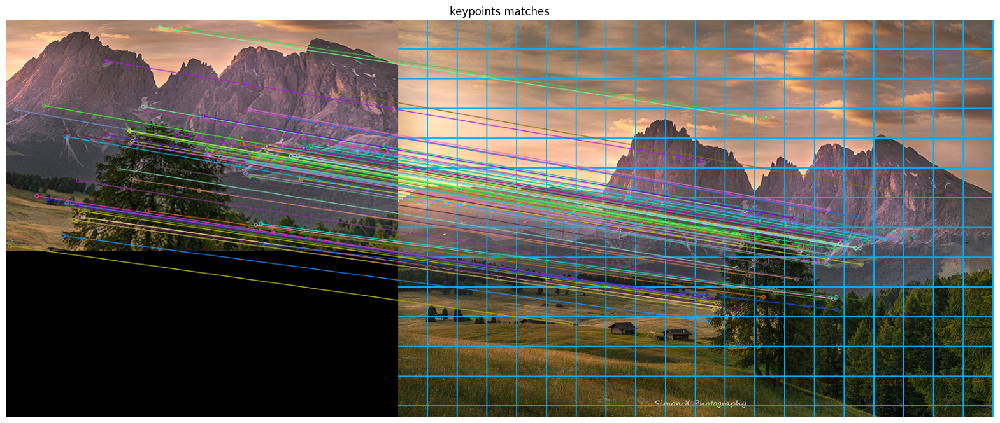

In [ ]:
bf = cv2.BFMatcher()
matches = bf.knnMatch(desc_test_1_edit, desc_test_1, k=2)

# store all the good matches as per Lowe's ratio test.
good_match = []
for m, n in matches:
    if m.distance < 0.5 * n.distance:
        good_match.append(m)

# if less then 10 points matched -> not the same images or higly distorted
MIN_MATCH_COUNT = 10
if len(good_match) > MIN_MATCH_COUNT:
    src_pts = np.float32([kp_test_1_edit[m.queryIdx].pt for m in good_match
                          ]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp_test_1[m.trainIdx].pt for m in good_match
                          ]).reshape(-1, 1, 2)

    kp_l_matched=([ kp_test_1_edit[m.queryIdx] for m in good_match ])
    kp_r_matched=([ kp_test_1[m.trainIdx] for m in good_match ])

    matches = cv2.drawMatches(rgb_test_1_edit,kp_test_1_edit,rgb_test_1,kp_test_1, good_match,None, flags=2)
    plt.figure(figsize=(20,10))
    plt.axis('off')
    plt.title("keypoints matches")
    plt.imshow(matches),plt.show()

else:
    print("Not  enough  matches are found   -   %d/%d" % (len(good_match), MIN_MATCH_COUNT))
    matchesMask = None

In [ ]:
# Homographie

H, mask = cv2.findHomography(dst_pts, src_pts, cv2.RANSAC, 5.0)
print(H)

[[ 6.43035969e-01 -2.78248959e-01 -1.46215889e+02]
 [-2.14966264e-02  5.01595316e-01 -6.02053327e+01]
 [-3.18055336e-04 -6.55145843e-04  1.00000000e+00]]


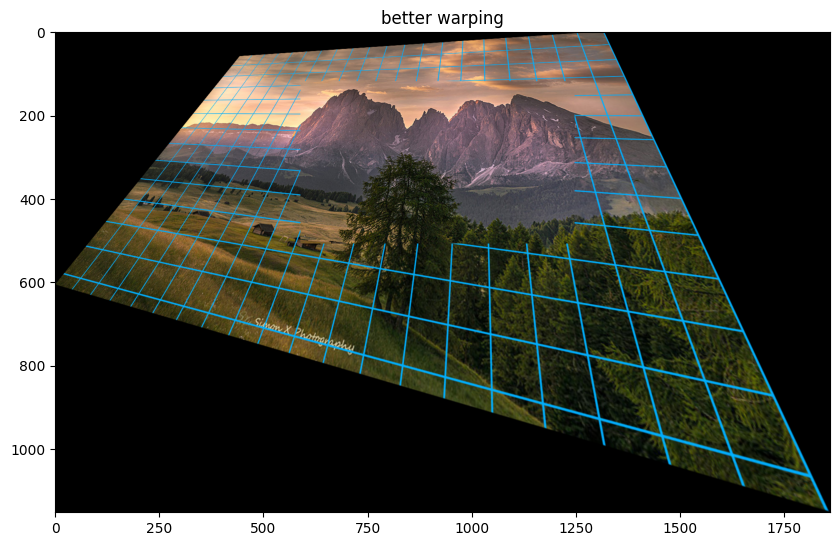

In [ ]:
def warpTwoImages(img1, img2, H):
    '''warp img2 to img1 with homograph H
    from: https://stackoverflow.com/questions/13063201/how-to-show-the-whole-image-when-using-opencv-warpperspective
    '''
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]
    pts1 = np.float32([[0, 0], [0, h1], [w1, h1], [w1, 0]]).reshape(-1, 1, 2)
    pts2 = np.float32([[0, 0], [0, h2], [w2, h2], [w2, 0]]).reshape(-1, 1, 2)
    pts2_ = cv2.perspectiveTransform(pts2, H)
    pts = np.concatenate((pts1, pts2_), axis=0)
    [xmin, ymin] = np.int32(pts.min(axis=0).ravel() - 0.5)
    [xmax, ymax] = np.int32(pts.max(axis=0).ravel() + 0.5)
    t = [-xmin, -ymin]
    Ht = np.array([[1, 0, t[0]], [0, 1, t[1]], [0, 0, 1]])  # translate

    result = cv2.warpPerspective(img2, Ht@H, (xmax-xmin, ymax-ymin))
    result[t[1]:h1+t[1], t[0]:w1+t[0]] = img1
    return result


result = warpTwoImages(rgb_test_1_edit, rgb_test_1, H)

plt.figure(figsize=(10, 10))
plt.imshow(result)
plt.title("better warping")
plt.show()


**Exercice 2 :** extend this program to several images taken from different points of view in order to obtain more complet panoramic image.

In [ ]:
def createPanoramicTwoImages(rgb_test1, rgb_test2, dist_factor):

  ### AFFICHAGE DES PHOTOS ###
  gray_test1 = cv2.cvtColor(rgb_test1, cv2.COLOR_RGB2GRAY)
  gray_test2 = cv2.cvtColor(rgb_test2, cv2.COLOR_RGB2GRAY)

  # Créer une figure avec deux sous-graphiques côte à côte
  fig, axes = plt.subplots(1, 2, figsize=(10, 10))

  axes[0].imshow(rgb_test1)
  axes[1].imshow(rgb_test2)

  for ax in axes:
      ax.axis('off')
  plt.show()

  ### KEYPOINTS ###
  # use orb if sift is not installed
  feature_extractor = cv2.xfeatures2d.SIFT_create()

  # find the keypoints and descriptors with chosen feature_extractor
  kp_test1, desc_test1 = feature_extractor.detectAndCompute(gray_test1, None)
  kp_test2, desc_test2 = feature_extractor.detectAndCompute(gray_test2, None)

  test = cv2.drawKeypoints(rgb_test1, kp_test1, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

  ### KEYPOINTS MATCHES ###
  bf = cv2.BFMatcher()
  matches = bf.knnMatch(desc_test1, desc_test2, k=2)

  # store all the good matches as per Lowe's ratio test.
  good_match = []
  for m, n in matches:
      if m.distance < dist_factor * n.distance:
          good_match.append(m)

  # if less then 10 points matched -> not the same images or higly distorted
  MIN_MATCH_COUNT = 10
  if len(good_match) > MIN_MATCH_COUNT:
      src_pts = np.float32([kp_test1[m.queryIdx].pt for m in good_match
                            ]).reshape(-1, 1, 2)
      dst_pts = np.float32([kp_test2[m.trainIdx].pt for m in good_match
                            ]).reshape(-1, 1, 2)

      kp_l_matched=([ kp_test1[m.queryIdx] for m in good_match ])
      kp_r_matched=([ kp_test2[m.trainIdx] for m in good_match ])

      matches = cv2.drawMatches(rgb_test1,kp_test1,rgb_test2,kp_test2, good_match,None, flags=2)
      plt.figure(figsize=(20,10))
      plt.axis('off')
      plt.title("keypoints matches")
      plt.imshow(matches),plt.show()

  else:
      print("Not  enough  matches are found   -   %d/%d" % (len(good_match), MIN_MATCH_COUNT))
      matchesMask = None

  ### HOMOGRAPHY ###
  H, mask = cv2.findHomography(dst_pts, src_pts, cv2.RANSAC, 5.0)

  ### WARP ###
  result = warpTwoImages(rgb_test1, rgb_test2, H)
  plt.figure(figsize=(10, 10))
  plt.imshow(result)
  plt.title("better warping")
  plt.show()

  return  result

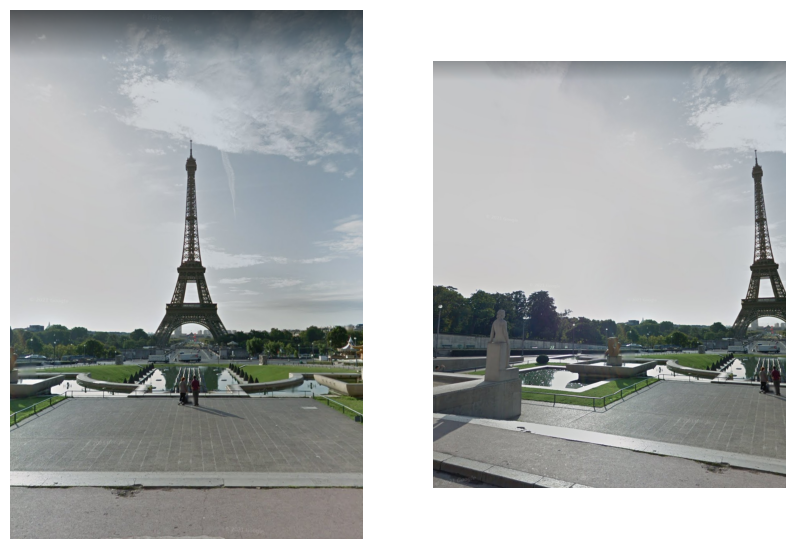

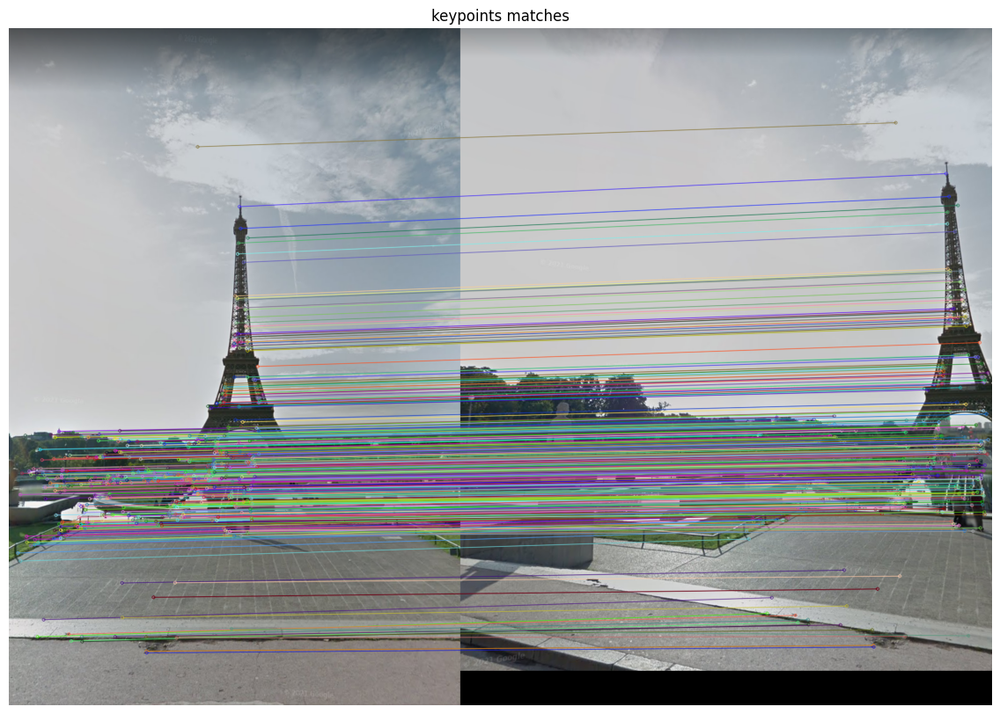

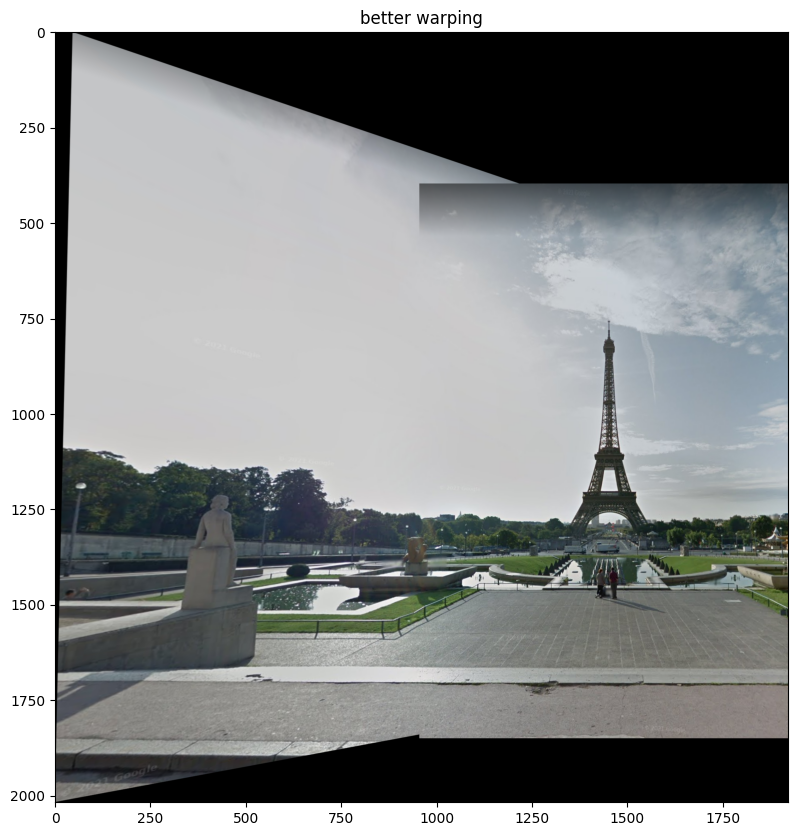

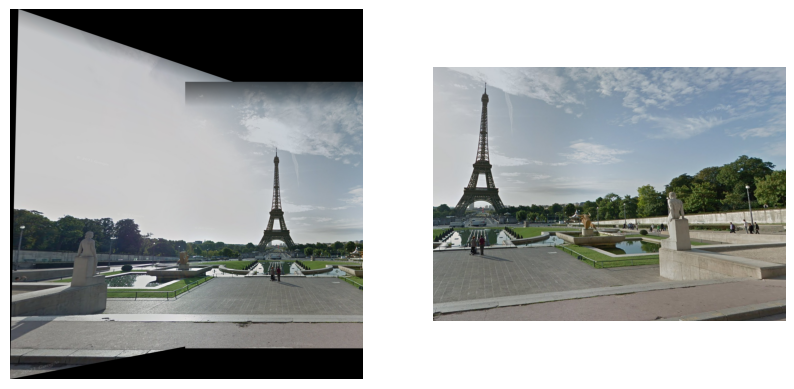

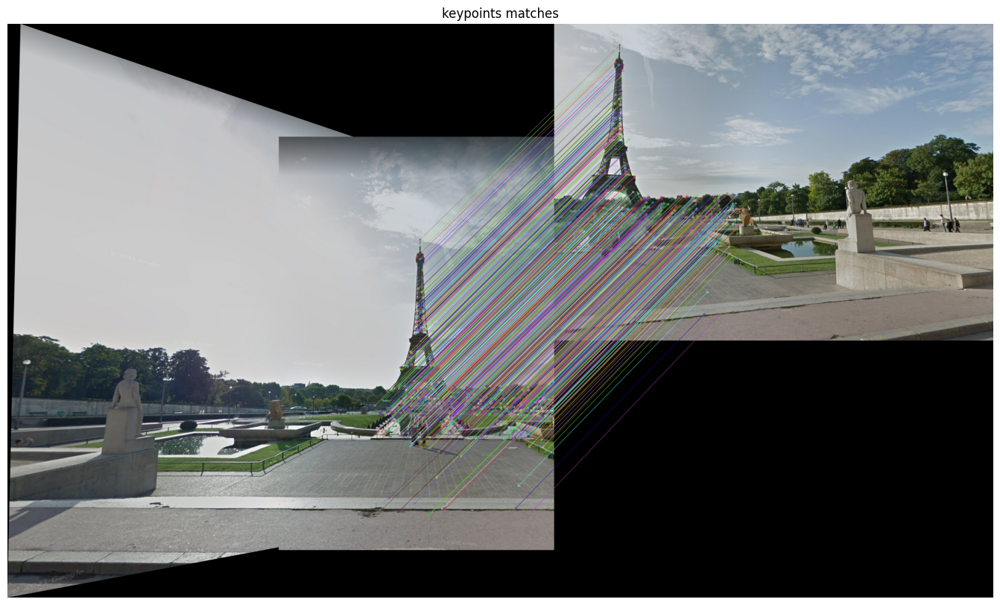

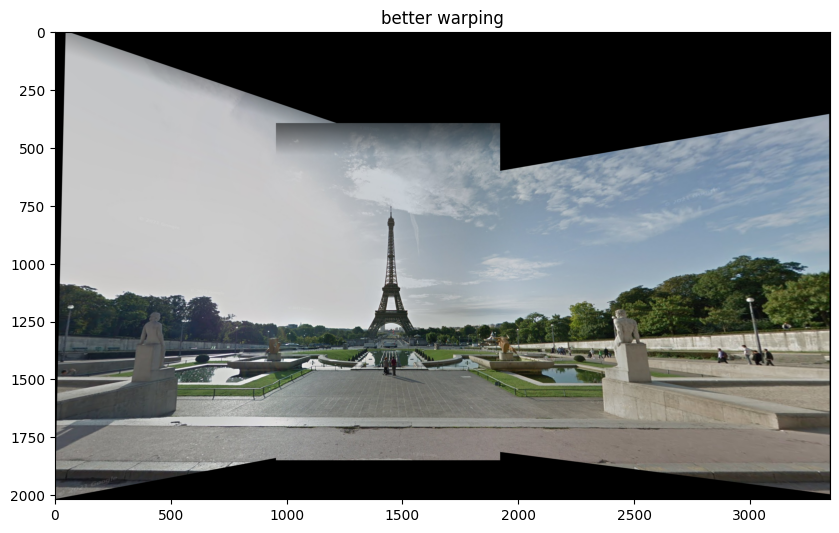

In [ ]:
rgb_test1 = cv2.cvtColor(cv2.imread("tour_eiffel_1.png"), cv2.COLOR_BGR2RGB)
rgb_test2 = cv2.cvtColor(cv2.imread("tour_eiffel_2.png"), cv2.COLOR_BGR2RGB)
rgb_test3 = cv2.cvtColor(cv2.imread("tour_eiffel_3.png"), cv2.COLOR_BGR2RGB)

rgb_test1_2 = createPanoramicTwoImages(rgb_test1, rgb_test2, dist_factor=0.3)
rgb_test1_2_3 = createPanoramicTwoImages(rgb_test1_2, rgb_test3, dist_factor=0.3)